## Catalog of LSB objects around Fornax for proposal

Here I present a catalog of UDGs (Generally low Surface Brightness - LSB) galaxies in a region $15' \times 15' $ around Fornax.

Coordinates of the center of Fornax:
\begin{equation}
RA_f = 54.61625 \\
DEC_f = −35.448333 
\end{equation}

Since $15' = 0.25^o$ we select a region $\pm 0.125^o$ around the center of Fornax cluster:

\begin{equation}
54.49125 \leq RA \leq 54.74125 \\
.\\
-35.573333 \leq DEC \leq -35.323333
\end{equation}

In [81]:
# Import stuff
import numpy as np
import scipy
import matplotlib
import matplotlib.pyplot as plt
from astropy.io import fits
import skymapper as skm
from code.plot_utils import plot_pretty
%matplotlib inline
%pylab inline 

Populating the interactive namespace from numpy and matplotlib


In [82]:
# Upload the candidates in that region

cand = fits.open('for_proposal.fits')
print cand[1].header.keys

<bound method Header.keys of XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  108 / length of dimension 1                          
NAXIS2  =                 4994 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                   24 / number of table fields                         
TTYPE1  = 'coadd_object_id'                                                     
TFORM1  = 'K       '                                                            
TTYPE2  = 'ra      '                                                            
TFORM2  = 'D       '                                                            

#### First import all data 

In [83]:
# Error and spread error
spr_mod_i = cand[1].data['spread_model_i']
spr_err_mod_i = cand[1].data['spreaderr_model_i' ]

# RA and DEC of every object
RA = cand[1].data['ra']
DEC = cand[1].data['dec']

# Magnitudes and flux radii
MAG_AUTO_G = cand[1].data['mag_auto_g']
MAG_AUTO_R = cand[1].data['mag_auto_r']
MAG_AUTO_I = cand[1].data['mag_auto_i']

FLUX_RADIUS_G = 0.263*cand[1].data['flux_radius_g']
FLUX_RADIUS_R = 0.263*cand[1].data['flux_radius_r']
FLUX_RADIUS_I = 0.263*cand[1].data['flux_radius_i'] 

# Kron radius

KRON_RAD = cand[1].data['kron_radius']

#======================================================================
#======================================================================
#Now the surface brightnesses 


#Effective model surface brightness (SB) above background [mag/sq. arcmin]. 
#SB at the isophote which includes half of the flux from the model, above background
mu_eff_g = cand[1].data['mu_eff_model_g']
mu_eff_r = cand[1].data['mu_eff_model_r']
mu_eff_i = cand[1].data['mu_eff_model_i']

#Peak surface brightness above background [mag/asec^2]
mu_max_g = cand[1].data['mu_max_g']
mu_max_r = cand[1].data['mu_max_r']
mu_max_i = cand[1].data['mu_max_i']

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
mu_mean_g = cand[1].data['mu_mean_model_g']
mu_mean_r = cand[1].data['mu_mean_model_r']
mu_mean_i = cand[1].data['mu_mean_model_i']

#Maximum surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
mu_max_mod_g = cand[1].data['mu_max_model_g']
mu_max_mod_r = cand[1].data['mu_max_model_r']
mu_max_mod_i = cand[1].data['mu_max_model_i']

print(np.size(RA))

4994


### Cuts that define the candidates

As we can see, we have a pretty large number of objects. I will make a series of cuts to reduce this to a handy number of candidates which, in turn, I will visually inspect.

We will define some cuts:

$\bullet$ Star-galaxy separation:
\begin{equation}
spread\_model\_i + (5/3)spreaderr\_model\_i > 0.007
\end{equation}

$ \bullet$ Color cuts. Following Greco et. al. (2018), I will select galaxies within the color box defined by:
\begin{equation}
-0.1 < g - i < 1.4 \\
(g-r) > 0.7\times(g-i) - 0.4 \\
(g-r) < 0.7\times (g-i) + 0.4,
\end{equation}
where $i,g,r$ are the SExtractor measured colors.

$ \bullet$ Angular size. We select objects with size 
\begin{equation}
2''.5 < r_{1/2} < 17''
\end{equation}

$r_{1/2}$ refers to the $i$-band half-light radius measured by SExtractor via the FLUX_RADIUS parameter. The numbers are in compliance with the cuts defined in Greco et. al., but are also reasonable /agree well with my findings from matching DES galaxis with the sample from Muñoz et al.


$\bullet$ Mean surface brightness. We adopt a cut on the mean surface brightness:
\begin{equation}
\bar{\mu}_{eff}(g) > 24 \mbox{mag arcsec}^{-2}
\end{equation}

a little bit less conservative than the criterion adopted in Greco et. al. 

In [84]:
# Define the cuts here 
#=============================================================

# Star-galaxy separation
star_gal_cut = ((spr_mod_i+(5.0/3.0)*spr_err_mod_i)>0.007)

# Color cuts 
col_1 = ((MAG_AUTO_G - MAG_AUTO_I)>(-0.1))
col_2 = ((MAG_AUTO_G - MAG_AUTO_I)<(1.4))
col_3 = ((MAG_AUTO_G - MAG_AUTO_R) > 0.7*(MAG_AUTO_G - MAG_AUTO_I) - 0.4)
col_4 = ((MAG_AUTO_G - MAG_AUTO_R) < 0.7*(MAG_AUTO_G - MAG_AUTO_I) + 0.4)
color_cuts = col_1&col_2&col_3&col_4

# Angular size cuts
ang_size_cut = (FLUX_RADIUS_G > 2.0)&(FLUX_RADIUS_G < 17.0)

# Surface brightness cut 
surf_bright_cut = (mu_mean_g > 24.0) 

#===================================================================
# Unite them:
# Selection cuts
sel_cut = star_gal_cut&ang_size_cut&surf_bright_cut&color_cuts

Apply the cuts now

In [85]:
# RA and DEC
RA_n = RA[sel_cut]
DEC_n = DEC[sel_cut]

#magnitudes - mag auto 
mag_g_n = MAG_AUTO_G[sel_cut]
mag_r_n = MAG_AUTO_R[sel_cut]
mag_i_n = MAG_AUTO_I[sel_cut]

# Angular sizes - flux radius
ang_g_n = FLUX_RADIUS_G[sel_cut]
ang_r_n = FLUX_RADIUS_R[sel_cut]
ang_i_n = FLUX_RADIUS_I[sel_cut]

#Effective model surface brightness (SB)
mu_eff_g_n = mu_eff_g[sel_cut]
mu_eff_r_n = mu_eff_r[sel_cut]
mu_eff_i_n = mu_eff_i[sel_cut]

#Peak surface brightness above background [mag/asec^2]
mu_max_g_n = mu_max_g[sel_cut]
mu_max_r_n = mu_max_r[sel_cut]
mu_max_i_n = mu_max_i[sel_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
mu_mean_g_n = mu_mean_g[sel_cut]
mu_mean_r_n = mu_mean_r[sel_cut]
mu_mean_i_n = mu_mean_i[sel_cut]

#Maximum surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
mu_max_mod_g_n = mu_max_mod_g[sel_cut]
mu_max_mod_r_n = mu_max_mod_r[sel_cut]
mu_max_mod_i_n = mu_max_mod_i[sel_cut]


print('After the cuts, the remaining candidate has size:')
print(len(RA_n))

After the cuts, the remaining candidate has size:
57


### Manual masking

While playing/visually inspecting candidates (after applying the above cuts) I reallized that many false-positive detections are around three very bright objects (stars?). So, here I will try to manually exclude the regions around these three objects. 

I used sky viewer to determine the coordinates of (the four points of) rectangles around these objets that seem to me to have a high probability to produce false positives (strange colors, differences in brightness etc).

The coordinates of the boxed I want to exclude are:

$\bullet$ Box 1:
\begin{equation}
(RA, DEC)_{1,2,3,4} = ( 54.70368, -35.40132); (54.55934, - 35.40132); (54.55934, -35.49489); (54.70368, -35.49489).
\end{equation}

$\bullet$ Box 2:
\begin{equation}
(RA, DEC)_{1,2,3,4} = (54.76608, -35.56444); (54.67098, -35.56444); (54.67098, -35.62218); (54.76608, -35.62218)
\end{equation}

$\bullet$ Box 3: 
\begin{equation}
(RA, DEC)_{1,2,3,4} = (54.77690, -35.61377) ; (54.71301, -35.61377) ; (54.71301, -35.65649) ; (54.77690, -35.65649)
\end{equation}

In [86]:
Region_1 = (RA_n>54.55934)&(RA_n<54.70368)&(DEC_n>-35.49484)&(DEC_n<-35.40132)
Region_2 = (RA_n>54.67098)&(RA_n<54.76608)&(DEC_n>-35.62218)&(DEC_n<-35.56444)
Region_3 = (RA_n>54.71301)&(RA_n<54.77690)&(DEC_n>-35.65649)&(DEC_n<-35.61377)


#print(Region_1)
keep = np.invert(Region_1)
print keep

[False  True False  True  True  True False False False  True False False
 False  True  True  True False False False False False False False False
 False  True False False False False False False False  True False False
 False False False False False False  True False False False False False
 False False False  True False False  True False  True]


##### Apply masking now

In [87]:
# RA and DEC
RA_mask = RA_n[keep]
DEC_mask = DEC_n[keep]

#magnitudes - mag auto 
mag_g_n = MAG_AUTO_G[sel_cut]
mag_r_n = MAG_AUTO_R[sel_cut]
mag_i_n = MAG_AUTO_I[sel_cut]

# Angular sizes - flux radius
ang_g_n = FLUX_RADIUS_G[sel_cut]
ang_r_n = FLUX_RADIUS_R[sel_cut]
ang_i_n = FLUX_RADIUS_I[sel_cut]

#Effective model surface brightness (SB)
mu_eff_g_n = mu_eff_g[sel_cut]
mu_eff_r_n = mu_eff_r[sel_cut]
mu_eff_i_n = mu_eff_i[sel_cut]

#Peak surface brightness above background [mag/asec^2]
mu_max_g_n = mu_max_g[sel_cut]
mu_max_r_n = mu_max_r[sel_cut]
mu_max_i_n = mu_max_i[sel_cut]

#Mean surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
mu_mean_g_n = mu_mean_g[sel_cut]
mu_mean_r_n = mu_mean_r[sel_cut]
mu_mean_i_n = mu_mean_i[sel_cut]

#Maximum surface brightness using the whole area inside the isophote used for MU_EFF_MODEL
mu_max_mod_g_n = mu_max_mod_g[sel_cut]
mu_max_mod_r_n = mu_max_mod_r[sel_cut]
mu_max_mod_i_n = mu_max_mod_i[sel_cut]


print('After masking, the remaining candidate has size:')
print(len(RA_mask))

After masking, the remaining candidate has size:
14


In [88]:
for i in range (len(RA_mask)):
    print RA_mask[i], ',', DEC_mask[i]

54.647367 , -35.557078
54.684042 , -35.554844
54.578228 , -35.530908
54.611748 , -35.50542
54.574172 , -35.528373
54.631719 , -35.505519
54.564706 , -35.509883
54.573315 , -35.511549
54.581504 , -35.535594
54.500074 , -35.481221
54.558804 , -35.482581
54.676069 , -35.55211
54.701221 , -35.551178
54.695986 , -35.55281


After inspecting the above, I find two that seem to be LSB galaxies indeed. First one:

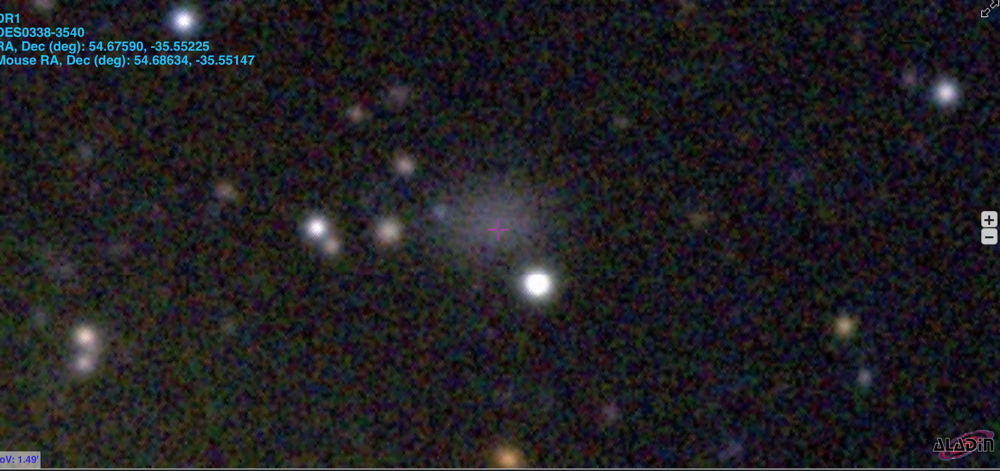

In [91]:
from IPython.display import Image
Image(filename='LSB_1.png')


Also an object that it is a galaxy of course, but I'm not $100\%$ sure if it is a Low brightness one.

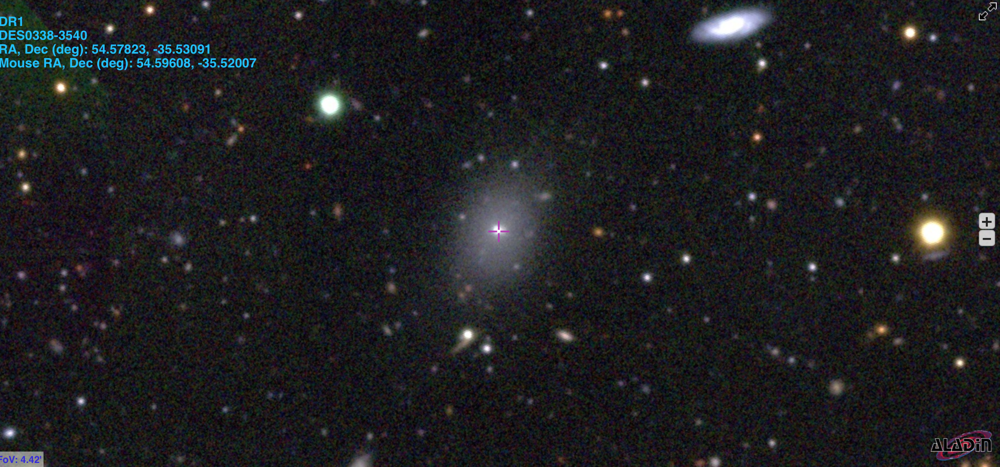

In [92]:
Image(filename='LSB_2.png')

Note that I tried to relax a bit the cuts I used above, but still, most of the candidates were false positives.